In [1]:
# * * * * * * * * * * * * * * * *
# Configuration
# * * * * * * * * * * * * * * * *
DATASET_DIR = '/workspace/datasets'
OUTPUT_DIR = '/workspace/outputs'

DEVICE= 'cpu'

In [2]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from collections import defaultdict
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import IncrementalPCA
from itertools import combinations
from scipy.stats import wasserstein_distance

from lunar_vae import VAE, train, SampleLatentSpace, VisualizeLatentSpace
from utils import (
    GenerateDensityPlot,
    LoadTemperatureDataV2
)

# * * * * * * * * * * * * * * * *
# Setting Variables
# * * * * * * * * * * * * * * * *
INPUT_CSV_PATH = os.path.join(DATASET_DIR, f'profiles-v2', f'profiles-v2.csv')

In [3]:
# * * * * * * * * * * * * * * * *
# Load Temp Data
# * * * * * * * * * * * * * * * *
temp_data = LoadTemperatureDataV2(INPUT_CSV_PATH, DEVICE)

Loading Profiles: 3891424it [04:46, 13575.60it/s]


Fitting IncrementalPCA...


Fitting: 100%|██████████| 39/39 [01:20<00:00,  2.08s/it]


Transforming with IncrementalPCA...


Transforming: 100%|██████████| 39/39 [00:01<00:00, 27.62it/s]


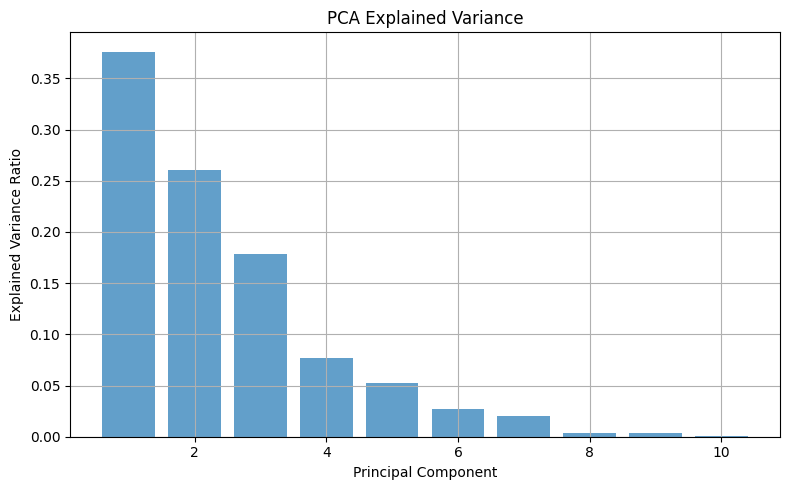

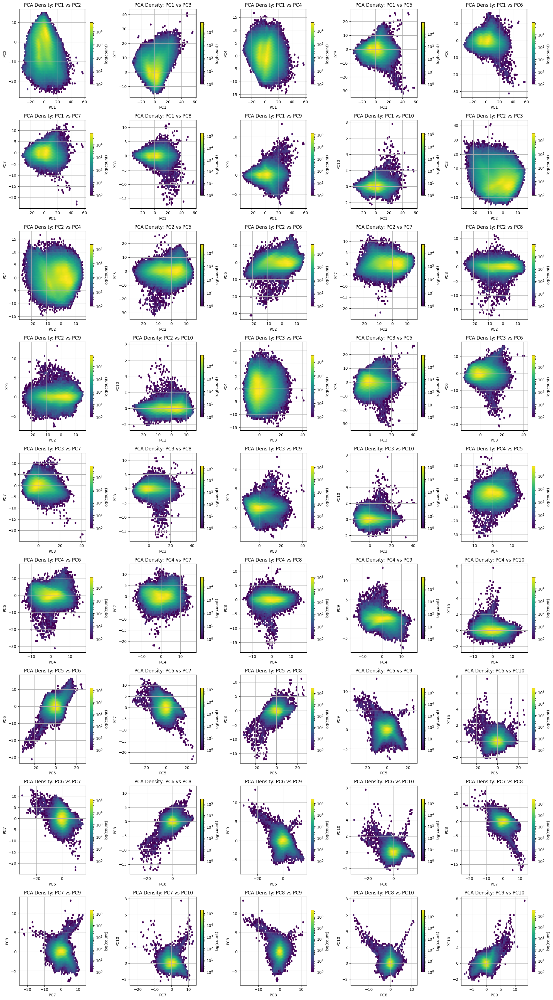

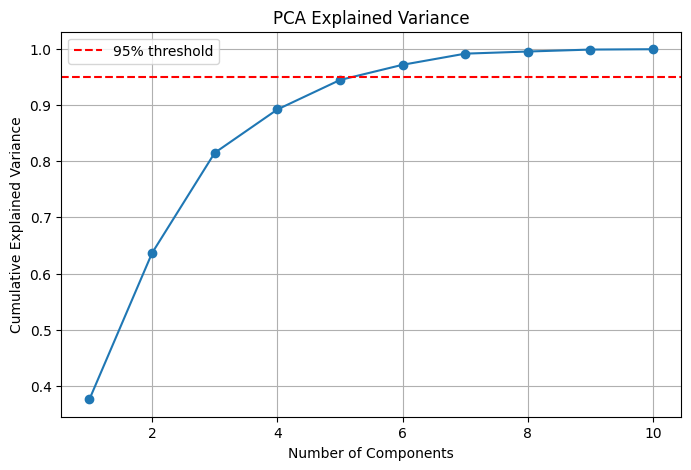

In [4]:
# * * * * * * * * * * * * * * * *
# Convert to numpy
# * * * * * * * * * * * * * * * *
temp_data_np = temp_data.numpy() 

# * * * * * * * * * * * * * * * *
# Setting Up for PCA
# * * * * * * * * * * * * * * * *
n_components = 10
batch_size = 100_000

# * * * * * * * * * * * * * * * *
# Standardize data
# * * * * * * * * * * * * * * * *
scaler = StandardScaler()
temp_data_scaled = scaler.fit_transform(temp_data_np)

# * * * * * * * * * * * * * * * *
# PCA Fitting
# * * * * * * * * * * * * * * * *
n_samples = temp_data_scaled.shape[0]
n_batches = n_samples // batch_size + int(n_samples % batch_size != 0)

ipca = IncrementalPCA(n_components=n_components)

print("Fitting IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Fitting"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    ipca.partial_fit(batch)

X_pca = np.zeros((n_samples, n_components))

print("Transforming with IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Transforming"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    X_pca[start:end] = ipca.transform(batch)

# * * * * * * * * * * * * * * * *
# Plot Variance 
# * * * * * * * * * * * * * * * *
# Plot variance explained
plt.figure(figsize=(8, 5))
plt.bar(range(1, n_components + 1), ipca.explained_variance_ratio_, alpha=0.7)
plt.ylabel("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Pair-wise Plots
# * * * * * * * * * * * * * * * *
pcs = X_pca[:, :n_components]
pairs = list(combinations(range(n_components), 2))

n_pairs = len(pairs)
cols = 5  
rows = (n_pairs + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)

for idx, (x_idx, y_idx) in enumerate(pairs):
    row = idx // cols
    col = idx % cols
    ax = axes[row, col]
    
    hb = ax.hexbin(pcs[:, x_idx], pcs[:, y_idx], gridsize=50, cmap='viridis', bins='log')
    ax.set_xlabel(f"PC{x_idx + 1}")
    ax.set_ylabel(f"PC{y_idx + 1}")
    ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1}")
    ax.grid(True)
    
    cb = fig.colorbar(hb, ax=ax, shrink=0.7)
    cb.set_label('log(count)')

for idx in range(n_pairs, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Scree Plot
# * * * * * * * * * * * * * * * *
explained_var_ratio = ipca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_var_ratio)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% threshold')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.legend()
plt.show()

Fitting IncrementalPCA...


Fitting: 100%|██████████| 39/39 [01:28<00:00,  2.27s/it]


Transforming with IncrementalPCA...


Transforming: 100%|██████████| 39/39 [00:01<00:00, 32.52it/s]


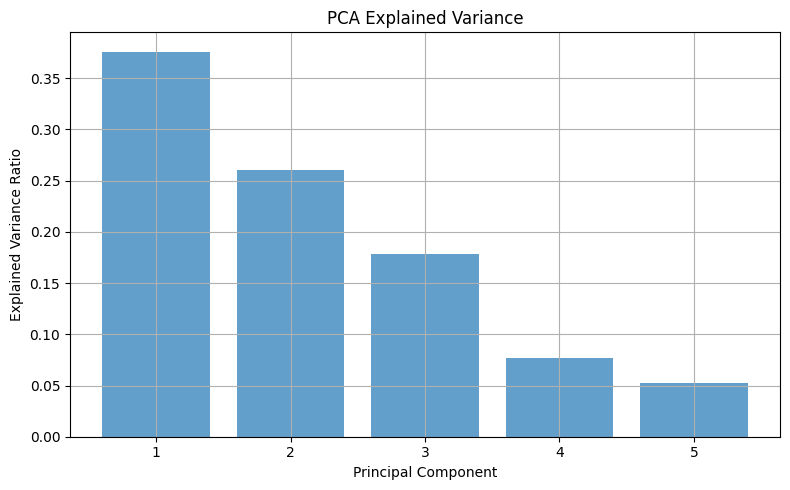

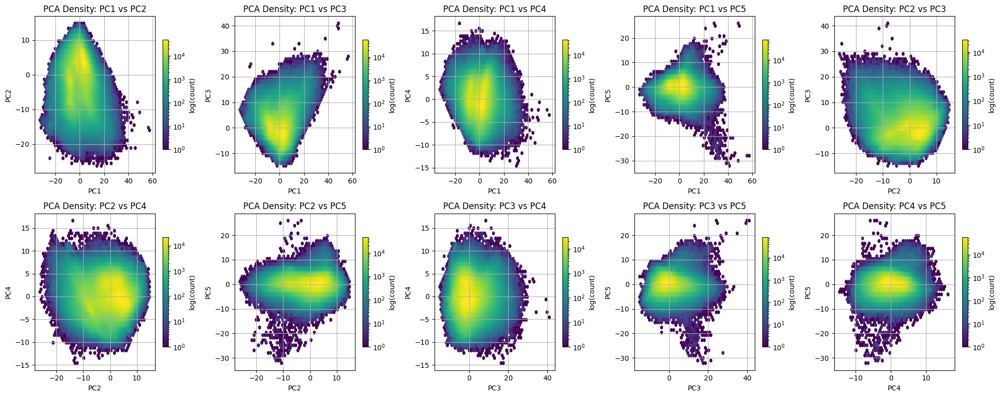

In [5]:
# * * * * * * * * * * * * * * * *
# Re-Do with Optimal n_components
# * * * * * * * * * * * * * * * *
n_components = 5

# * * * * * * * * * * * * * * * *
# PCA Fitting
# * * * * * * * * * * * * * * * *
n_samples = temp_data_scaled.shape[0]
n_batches = n_samples // batch_size + int(n_samples % batch_size != 0)

ipca = IncrementalPCA(n_components=n_components)

print("Fitting IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Fitting"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    ipca.partial_fit(batch)

X_pca = np.zeros((n_samples, n_components))

print("Transforming with IncrementalPCA...")
for i in tqdm(range(n_batches), desc="Transforming"):
    start = i * batch_size
    end = min((i + 1) * batch_size, n_samples)
    batch = temp_data_scaled[start:end]
    X_pca[start:end] = ipca.transform(batch)

# * * * * * * * * * * * * * * * *
# Plot Variance 
# * * * * * * * * * * * * * * * *
# Plot variance explained
plt.figure(figsize=(8, 5))
plt.bar(range(1, n_components + 1), ipca.explained_variance_ratio_, alpha=0.7)
plt.ylabel("Explained Variance Ratio")
plt.xlabel("Principal Component")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.tight_layout()
plt.show()

# * * * * * * * * * * * * * * * *
# Pair-wise Plots
# * * * * * * * * * * * * * * * *
pcs = X_pca[:, :n_components]
pairs = list(combinations(range(n_components), 2))

n_pairs = len(pairs)
cols = 5  
rows = (n_pairs + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)

for idx, (x_idx, y_idx) in enumerate(pairs):
    row = idx // cols
    col = idx % cols
    ax = axes[row, col]
    
    hb = ax.hexbin(pcs[:, x_idx], pcs[:, y_idx], gridsize=50, cmap='viridis', bins='log')
    ax.set_xlabel(f"PC{x_idx + 1}")
    ax.set_ylabel(f"PC{y_idx + 1}")
    ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1}")
    ax.grid(True)
    
    cb = fig.colorbar(hb, ax=ax, shrink=0.7)
    cb.set_label('log(count)')

for idx in range(n_pairs, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()


Final balanced sample size: 71207


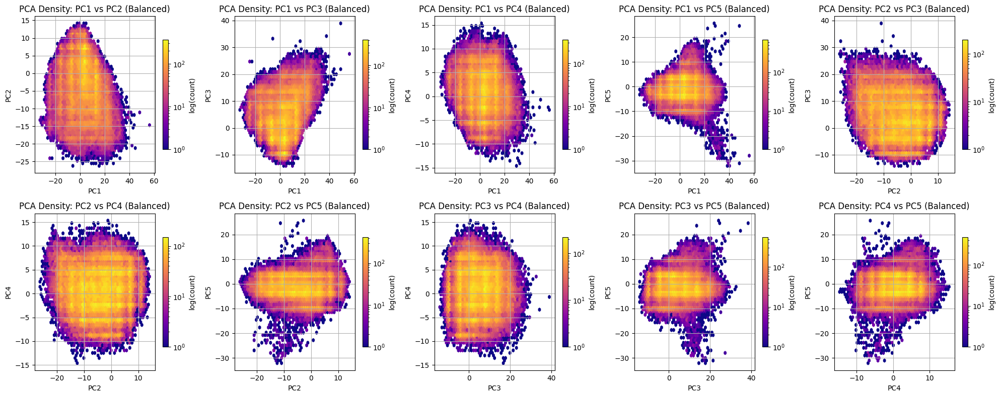

Balanced sample shape (original scale): torch.Size([71207, 120])
Saved figure to /workspace/density_plot.png


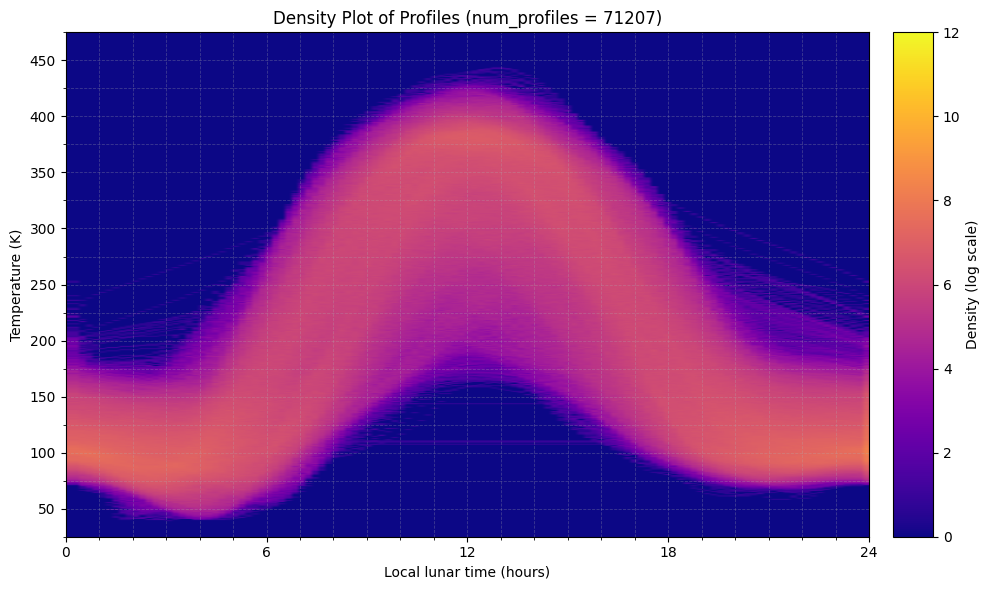

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-25-5d.pt
Final balanced sample size: 119249


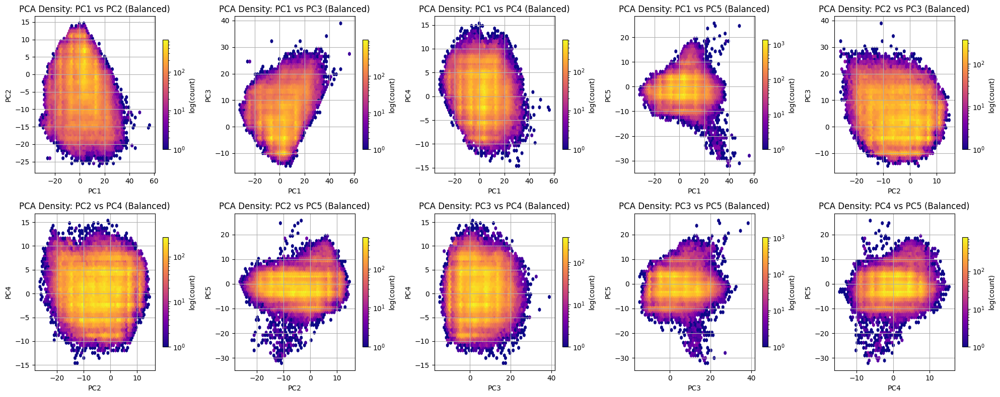

Balanced sample shape (original scale): torch.Size([119249, 120])
Saved figure to /workspace/density_plot.png


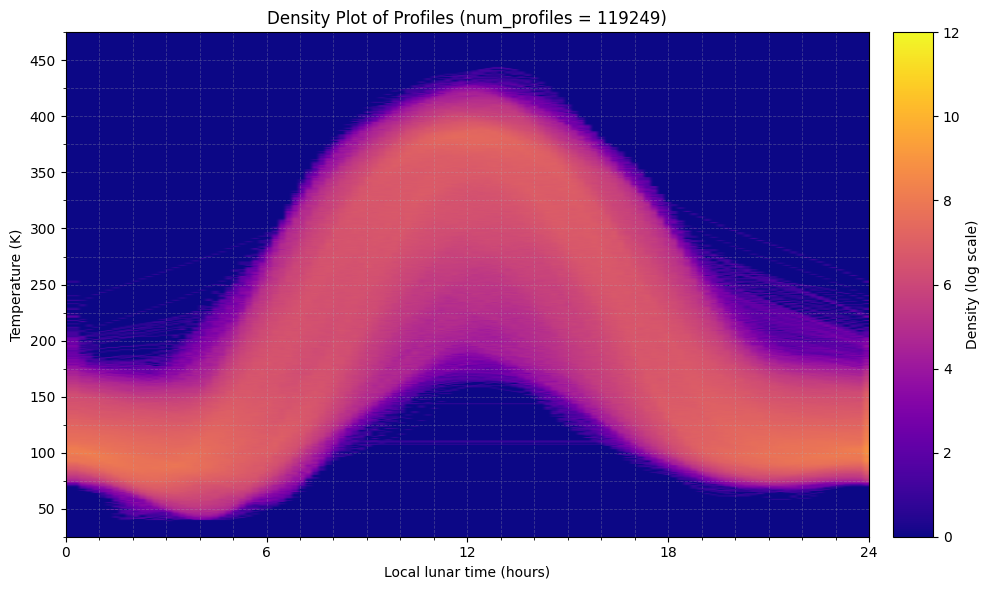

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-50-5d.pt
Final balanced sample size: 159534


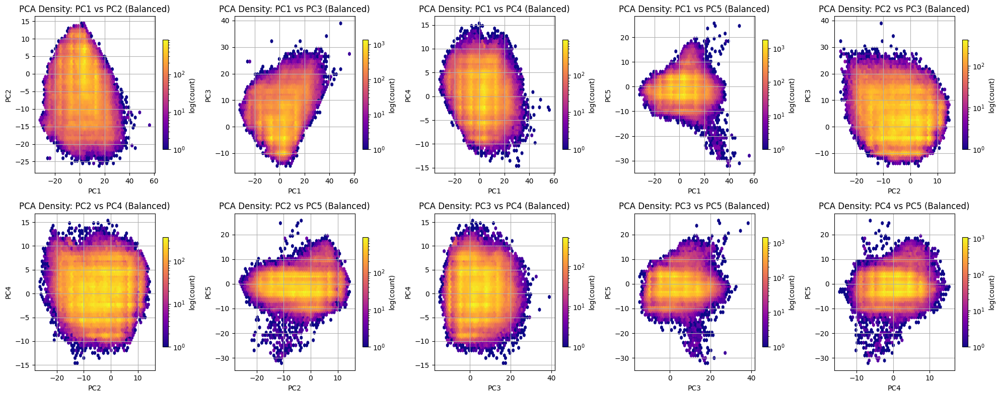

Balanced sample shape (original scale): torch.Size([159534, 120])
Saved figure to /workspace/density_plot.png


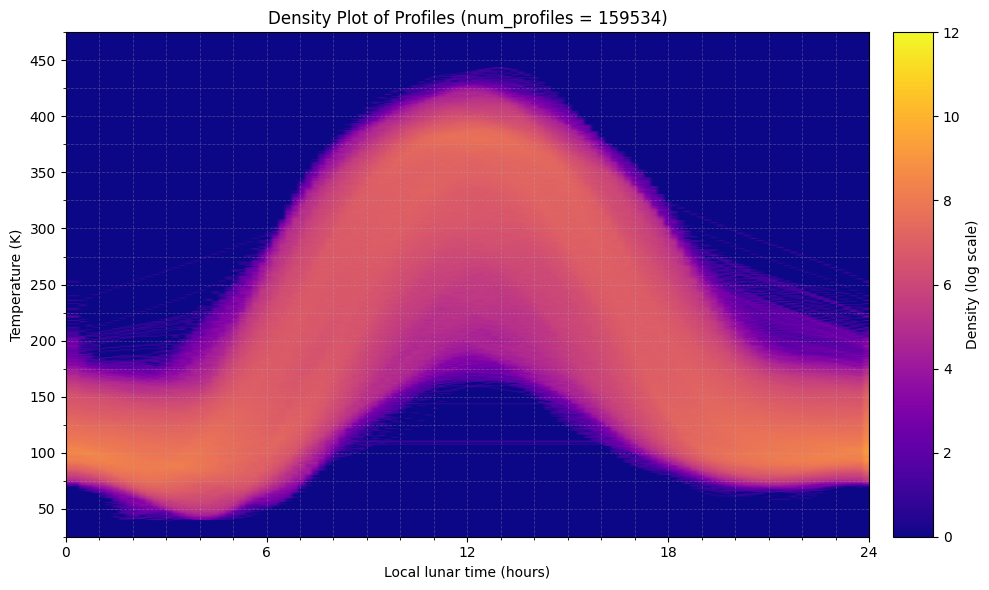

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-75-5d.pt
Final balanced sample size: 194878


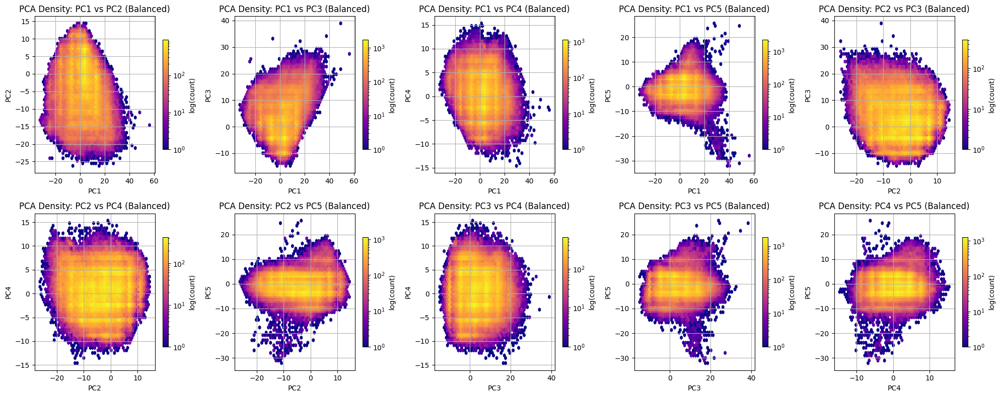

Balanced sample shape (original scale): torch.Size([194878, 120])
Saved figure to /workspace/density_plot.png


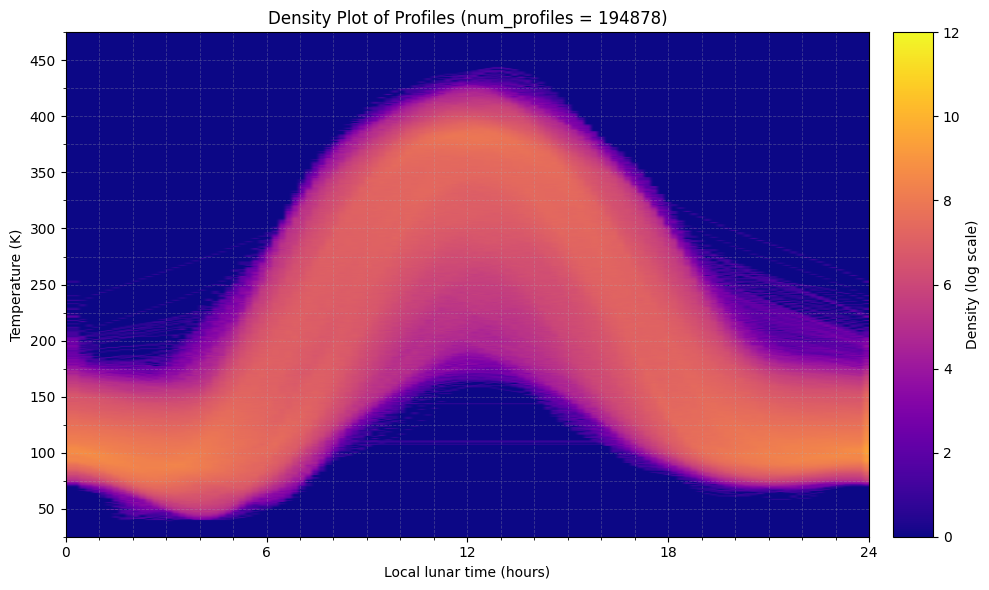

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-100-5d.pt
Final balanced sample size: 357928


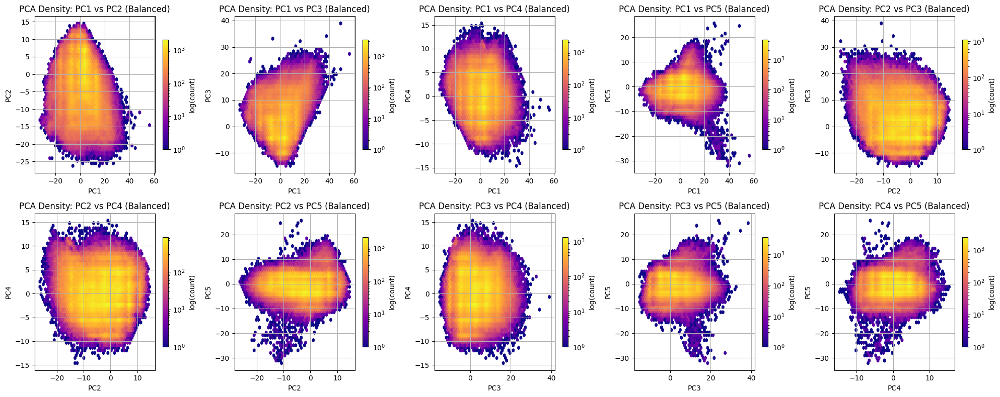

Balanced sample shape (original scale): torch.Size([357928, 120])
Saved figure to /workspace/density_plot.png


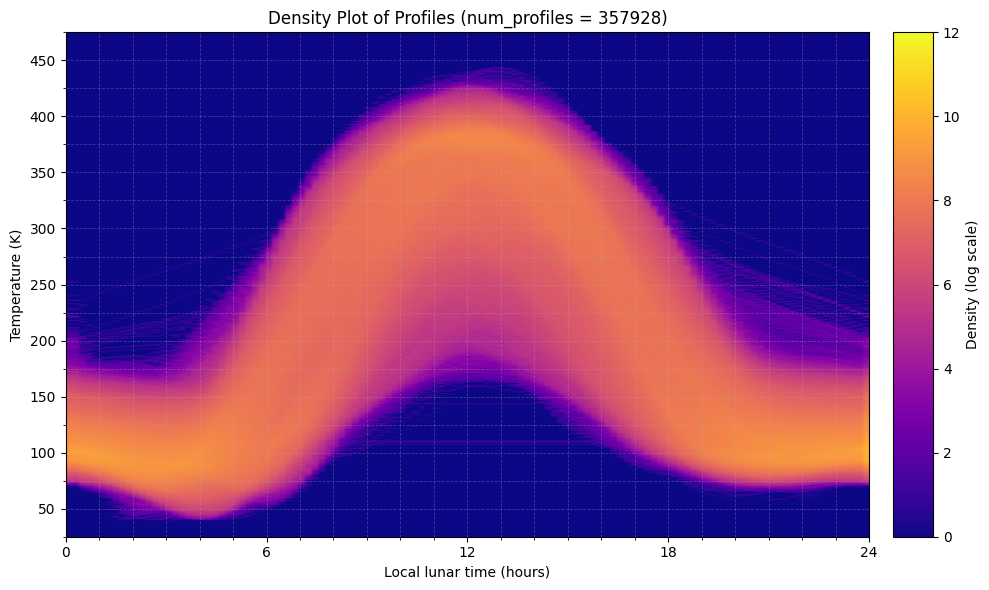

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-250-5d.pt
Final balanced sample size: 551421


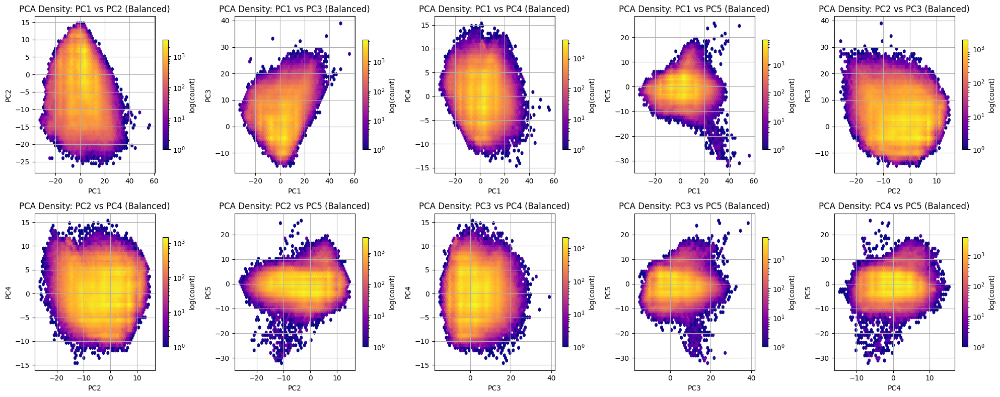

Balanced sample shape (original scale): torch.Size([551421, 120])
Saved figure to /workspace/density_plot.png


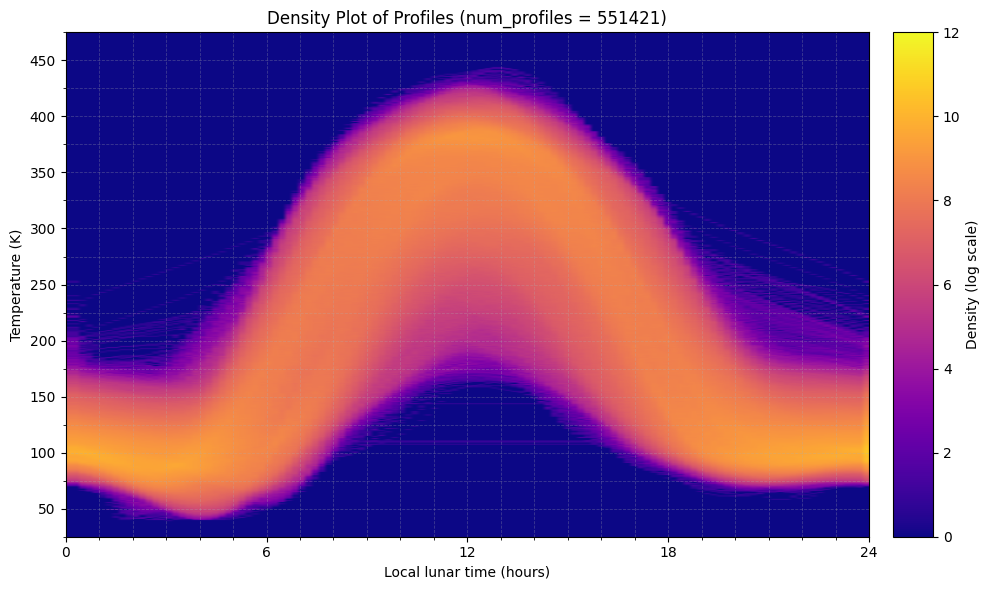

Saved /workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-500-5d.pt


In [6]:
# * * * * * * * * * * * * * * * *
# Samples from 5D PCA space
# * * * * * * * * * * * * * * * *
sample_sizes = [25, 50, 75, 100, 250, 500]
#sample_sizes = [100]
grid_size = 10  # 10 bins per PC = 100,000 total possible cells in 5D

n_dims = 5  # PC1 to PC5

for sample_size in sample_sizes:
    max_samples_per_cell = sample_size

    # Define bin edges for each PC dimension
    bins = [np.linspace(X_pca[:, i].min(), X_pca[:, i].max(), grid_size + 1) for i in range(n_dims)]

    # Digitize across all 5 dimensions
    digitized = [np.digitize(X_pca[:, i], bins[i]) - 1 for i in range(n_dims)]
    grid_keys = list(zip(*digitized))  # Each key is a 5D cell ID

    # Group indices by grid cell
    cell_to_indices = defaultdict(list)
    for idx, cell in enumerate(grid_keys):
        if all(0 <= cell[d] < grid_size for d in range(n_dims)):
            cell_to_indices[cell].append(idx)

    total_points = sum(len(indices) for indices in cell_to_indices.values())
    balanced_indices = []

    # Sample from each non-empty cell
    for cell, indices in cell_to_indices.items():
        proportion = len(indices) / total_points
        samples = min(int(proportion * total_points), max_samples_per_cell)
        if samples > 0:
            selected = np.random.choice(indices, samples, replace=False)
            balanced_indices.extend(selected)

    balanced_indices = np.array(balanced_indices)
    X_balanced = X_pca[balanced_indices]

    print(f"Final balanced sample size: {X_balanced.shape[0]}")

    # * * * * * * * * * * * * * * * *
    # Visualize Sampled Data PCA
    # * * * * * * * * * * * * * * * *
    pcs_balanced = X_balanced[:, :n_components]
    pairs = list(combinations(range(n_components), 2))

    n_pairs = len(pairs)
    cols = 5
    rows = (n_pairs + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), squeeze=False)

    for idx, (x_idx, y_idx) in enumerate(pairs):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]

        hb = ax.hexbin(pcs_balanced[:, x_idx], pcs_balanced[:, y_idx],
                       gridsize=50, cmap='plasma', bins='log')
        ax.set_xlabel(f"PC{x_idx + 1}")
        ax.set_ylabel(f"PC{y_idx + 1}")
        ax.set_title(f"PCA Density: PC{x_idx + 1} vs PC{y_idx + 1} (Balanced)")
        ax.grid(True)

        cb = fig.colorbar(hb, ax=ax, shrink=0.7)
        cb.set_label('log(count)')

    for idx in range(n_pairs, rows * cols):
        fig.delaxes(axes.flatten()[idx])

    plt.tight_layout()
    plt.show()

    # * * * * * * * * * * * * * * * *
    # Visualize Sampled Data Density
    # * * * * * * * * * * * * * * * *
    temp_balanced_standardized = temp_data_scaled[balanced_indices]
    temp_balanced_unscaled = scaler.inverse_transform(temp_balanced_standardized)

    temp_tensor = torch.from_numpy(temp_balanced_unscaled).float()
    print("Balanced sample shape (original scale):", temp_tensor.shape)

    GenerateDensityPlot(temp_tensor, "/workspace/")

    torch_filename = f"/workspace/datasets/profiles-v2/profiles-v2-pca-5d/profiles-v2-pca-5-sample-{sample_size}-5d.pt"
    torch.save(temp_tensor, torch_filename)
    print(f"Saved {torch_filename}")
